<a href="https://colab.research.google.com/github/tayllatheodoro/Introduction_to_Image_Processing_MO443/blob/main/Esteganografia/Trabalho1_MO443.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Trabalho 1 - Esteganografia
Disciplina: MO443 - Introduction to Image Processing 

Docente: Helio Pedrini

Discente: Taylla Milena Theodoro

RA: 219596

---

Esteganografia estuda como esconder arquivos dentro de imagens. Estes arquivos podem ser outras imagens, ou textos por exemplo. Há várias formas de fazer isso, e uma delas tira vantagem do fato de que poucas informações significativas são armazenadas nos ultimos bits de imagens, e que altera-los causaria pouca ou quase nenhuma diferença visual para nós seres humanos.

O processo de esteganografia é formado por um encoder, que é responsável por alterar a imagem e esconder o arquivo e um decoder, que recebe a imagem com o arquivo escondido e retorna o que está escondido.

Este trabalho tem como objetivo esconder textos de diferentes tamanho em diferentes imagem no bit menos significativo delas e analisar quais alterações foram causadas.

A imagem a seguir mostra as entradas e saídas de cada processo de esteganografia.

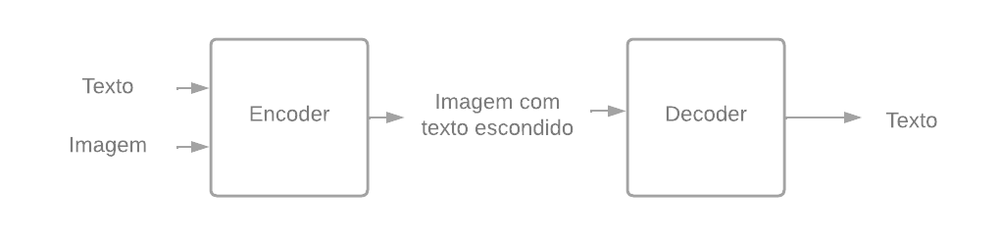

## Bibliotecas 

In [ ]:
import numpy as np
import imageio
import matplotlib.pyplot as plt

## Inputs
Tem-se como entrada do encoder um texto do tipo ascci (não ascii não é suportado por este modelo de esteganografia) e uma imagem na qual deseja-se esconder o texto.

Foi escolhido 3 textos diferentes, a fim de analisar o quanto o tamanho do texto altera as imagens de entrada. O primeiro é uma frase bem conhecida do universo de Star Wars, o segundo é uma música chamada Do I wanna know - Arctic Monekeys e por fim  o roteiro inteiro do filme Bee Movie - A história de uma abelha.

Foram escolhidas 4 imagens de entrada de exemplo para análise: Baboon, monalisa, peppers e watch.

### Textos

In [ ]:
text_1 = input("Entre com o texto: ")
if not text_1.isascii():
  raise "Non ascii text are currently not supported."

Entre com o texto: May the force be with you


In [ ]:
text_2 = input("Entre com o texto: ")
if not text_2.isascii():
  raise "Non ascii text are currently not supported."

Entre com o texto: Have you got color in your cheeks' Do you ever get the feeling that you can't shift the tide That sticks around like something's in your teeth And some aces up your sleeve I had no idea that you're in deep I dreamt about you near me every night this week How many secrets can you keep' 'Cause there's this tune I found that makes me think of you somehow When I play it on repeat Until I fall asleep Spilling drinks on my settee  (Do I wanna know?) If this feeling flows both ways (Sad to see you go) Was sorta hoping that you'd stay (Baby we both know) That the nights were mainly made for saying things that you can't say tomorrow day  Crawlin' back to you.  Ever thought of calling when you've had a few? 'Cause I always do Maybe I'm too busy being yours to fall for somebody new Now I've thought it through  Crawling back to you  So have you got the guts? Been wondering if your heart's still open and if so I wanna know what time it shuts Simmer down and pucker up I'm sorry to

In [ ]:
text_2

"Have you got color in your cheeks' Do you ever get the feeling that you can't shift the tide That sticks around like something's in your teeth And some aces up your sleeve I had no idea that you're in deep I dreamt about you near me every night this week How many secrets can you keep' 'Cause there's this tune I found that makes me think of you somehow When I play it on repeat Until I fall asleep Spilling drinks on my settee  (Do I wanna know?) If this feeling flows both ways (Sad to see you go) Was sorta hoping that you'd stay (Baby we both know) That the nights were mainly made for saying things that you can't say tomorrow day  Crawlin' back to you.  Ever thought of calling when you've had a few? 'Cause I always do Maybe I'm too busy being yours to fall for somebody new Now I've thought it through  Crawling back to you  So have you got the guts? Been wondering if your heart's still open and if so I wanna know what time it shuts Simmer down and pucker up I'm sorry to interrupt it's ju

In [ ]:
text_3 = input("Entre com o texto: ")
if not text_3.isascii():
  raise "Non ascii text are currently not supported."

Entre com o texto: According to all known laws of aviation, there is no way a bee should be able to fly. Its wings are too small to get its fat little body off the ground. The bee, of course, flies anyway because bees don't care what humans think is impossible. Yellow, black. Yellow, black. Yellow, black. Yellow, black. Ooh, black and yellow! Let's shake it up a little. Barry! Breakfast is ready! Ooming! Hang on a second. Hello? - Barry? - Adam? - Oan you believe this is happening? - I can't. I'll pick you up. Looking sharp. Use the stairs. Your father paid good money for those. Sorry. I'm excited. Here's the graduate. We're very proud of you, son. A perfect report card, all B's. Very proud. Ma! I got a thing going here. - You got lint on your fuzz. - Ow! That's me! - Wave to us! We'll be in row 118,000. - Bye! Barry, I told you, stop flying in the house! - Hey, Adam. - Hey, Barry. - Is that fuzz gel? - A little. Special day, graduation. Never thought I'd make it. Three days grade scho

In [ ]:
text_3

'According to all known laws of aviation, there is no way a bee should be able to fly. Its wings are too small to get its fat little body off the ground. The bee, of course, flies anyway because bees don\'t care what humans think is impossible. Yellow, black. Yellow, black. Yellow, black. Yellow, black. Ooh, black and yellow! Let\'s shake it up a little. Barry! Breakfast is ready! Ooming! Hang on a second. Hello? - Barry? - Adam? - Oan you believe this is happening? - I can\'t. I\'ll pick you up. Looking sharp. Use the stairs. Your father paid good money for those. Sorry. I\'m excited. Here\'s the graduate. We\'re very proud of you, son. A perfect report card, all B\'s. Very proud. Ma! I got a thing going here. - You got lint on your fuzz. - Ow! That\'s me! - Wave to us! We\'ll be in row 118,000. - Bye! Barry, I told you, stop flying in the house! - Hey, Adam. - Hey, Barry. - Is that fuzz gel? - A little. Special day, graduation. Never thought I\'d make it. Three days grade school, thr

### Imagens 

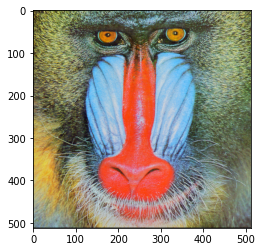

In [ ]:
img_1 = imageio.imread('baboon.png')
plt.imshow(img_1)


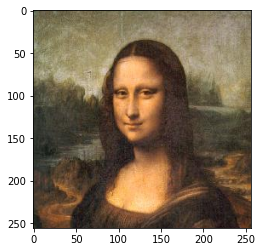

In [ ]:
img_2 = imageio.imread('monalisa.png')
plt.imshow(img_2)

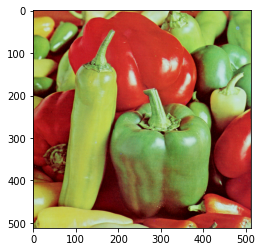

In [ ]:
img_3 = imageio.imread('peppers.png')
plt.imshow(img_3)

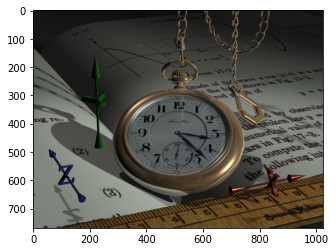

In [ ]:
img_4 = imageio.imread('watch.png')
plt.imshow(img_4)

## Encoder

O encoder tem como objetivo esconder o texto recebido dentro da imagem recebida. 
Nessa implementação foi escolhida uma abordagem vetorizada com duas transformações com as entradas. 

Primeiro, é adicionado ao texto os caracteres '@&' como criterio de fim de arquivo, para que durante a etapa de decoder seja possível saber o fim do texto. Em seguida, o texto é convertido para binário utilizando o método format em cada caracter do texto. Por fim, o texto é convertido em uma array para a etapa de substituição.

Em seguida, utiliza-se uma máscara de bits para selecionar a última camada de bits da imagem (camada de bits menos significativos). Esta tem sua dimensionalidade mudada para 1, com objetivo de vetorizar a substituição dos valores pelo texto em bits, o que também implica que os canais de cores serão alterados. É selecionado apenas o slice do array do tamanho do texto, e os valores são alterados. A outra parte dos bits permanece inalterada.
Em seguida, substitui-se essa nova camada de bits com o texto na ultima camada de bits, e a imagem encodada é retornada como saída.

In [ ]:
def encoder(img,text):
    """
    Função que esconde o texto dentro de uma imagem.
    inputs: 
    img - imagem original
    text - texto a ser escondido
    outputs:
    img_encoded - imagem encodada
  
    """
    #Total de pixels da imagem
    W,H,C= img.shape
    img_pixels = W*H*C
    
    #Pre-processamento do texto
    #Adicionando o fim de file
    text+='@&'   
    #texto->bits
    text_bits = ''.join([format(ord(i), "08b") for i in text])
    #Total de pixels necessarios para esconder o texto 
    text_req_pixel = len(text_bits)
    text_array = np.array(list(text_bits))

    #Teste se o texto cabe dentro da imagem
    if text_req_pixel > img_pixels:
      print("ERROR: Need a bigger image.")
      return False
    
    #Máscara que retorna a camada com o plano de bits menos significativo
    img_bits = img & 2 ** 0

    #Reshape para uma dimensão, a fim de ter a mesma dimensão do texto
    img_bits = np.reshape(img_bits,(img.shape[0]*img.shape[1]*img.shape[2]))

    # É selecionado a parte da imagem que possui tamanho necessário para guardar os textos 
    img_bits[:len(text_array)] = text_array

    #Reshape para as dimensões originais da imagem
    img_bits = np.reshape(img_bits,(img.shape[0],img.shape[1],img.shape[2]))

    #substituição da ultima camada da imagem original pela camada de bits com a imagem
    img_encoded = (img & 0b11111110) + img_bits

    return img_encoded

## Decoder

In [ ]:
def decoder(img):
  """
    Função que encontra o texto escondido dentro de uma imagem.
    inputs: 
    img - imagem encodada
    outputs:
    dado_encontrado - texto encontrado
  """
  #Máscara que seleciona a camada do bit menos significativo
  img_bits = img & 2 ** 0
  #reshape para melhor manipulação dos dados
  img_bits = np.reshape(img_bits,(img.shape[0]*img.shape[1]*img.shape[2]))

  #Encontrando o texto na imagem, bit a bit e concatenando em uma string
  texto_escondido=""
  for i in range(len(img_bits)):
    texto_escondido+=str(img_bits[i])
  
  #Transformar texto em bits para bytes
  text_bytes = [texto_escondido[i:i+8]for i in range(0,len(texto_escondido),8)]
  
  #Transformar texto em bytes para texto
  dado_encontrado =""
  for b in text_bytes:
    dado_encontrado+=chr(int(b,2))
    if dado_encontrado[-2:] == "@&":
      return dado_encontrado[:-2]

## Funções

In [ ]:
def plan_of_bits(img,k):
  """
  Função que retorna o plano de bits de uma imagem
  inputs:
  img - imagem 
  k - plano de bits
  outputs:
  img_bits - plano de bits da imagem
  """
  W,H,C=img.shape
  
  img_bits = img & 2 ** k
  img_bits[img_bits == 2 ** k] = 255

  return img_bits

In [ ]:
def plot_plan_of_bits(img):
  """
  Função que plota todos os planos de bits de uma imagem
  inputs:
  img - imagem 
  outputs:
  plot de cada plano de bit
  """
  plt.figure(figsize=(12,12)) 
  plt.subplot(241)
  plt.imshow(plan_of_bits(img,0))
  plt.title('Bit 0')
  plt.axis('off') 

  plt.subplot(242) 
  plt.imshow(plan_of_bits(img,1))
  plt.title('Bit 1')
  plt.axis('off') 

  plt.subplot(243)
  plt.imshow(plan_of_bits(img,2))
  plt.title('Bit 2')
  plt.axis('off') 

  plt.subplot(244) 
  plt.imshow(plan_of_bits(img,3))
  plt.title('Bit 3')
  plt.axis('off') 
  
  plt.subplot(245)
  plt.imshow(plan_of_bits(img,4))
  plt.title('Bit 4')
  plt.axis('off') 

  plt.subplot(246) 
  plt.imshow(plan_of_bits(img,5))
  plt.title('Bit 5')
  plt.axis('off') 

  plt.subplot(247)
  plt.imshow(plan_of_bits(img,6))
  plt.title('Bit 6')
  plt.axis('off') 

  plt.subplot(248) 
  plt.imshow(plan_of_bits(img,7))
  plt.title('Bit 7')
  plt.axis('off') 

In [ ]:
def plot_rgb(img):
  """
  Função que plota todos os canais de cores uma imagem
  inputs:
  img - imagem 
  outputs:
  plot de cada canal de cor de uma imagem
  """
  plt.figure(figsize=(12,12)) 
  plt.subplot(131)
  plt.imshow(img[:,:,0],cmap="gray")
  plt.title('R')
  plt.axis('off') 

  plt.subplot(132) 
  plt.imshow(img[:,:,1],cmap="gray")
  plt.title('G')
  plt.axis('off') 

  plt.subplot(133)
  plt.imshow(img[:,:,2],cmap="gray")
  plt.title('B')
  plt.axis('off') 


## Experimentos

Com o objetivo de analisar o método e quais foram as alterações causadas por ele, as imagems (1,2.3,4) foram analisadas para a imagem original e separadamente para da texto de entrada (1,2,3). Foram plotados os canais de cores e os planos de bits, antes e depois da esteganografia.

### Imagem 1
É uma imagem de tamanho (512,512,3) de um babuíno.

#### Imagem Original

In [ ]:
img_1.shape

(512, 512, 3)

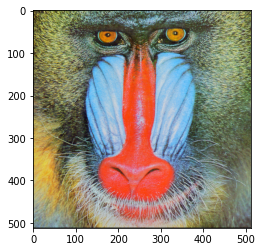

In [ ]:
plt.imshow(img_1)

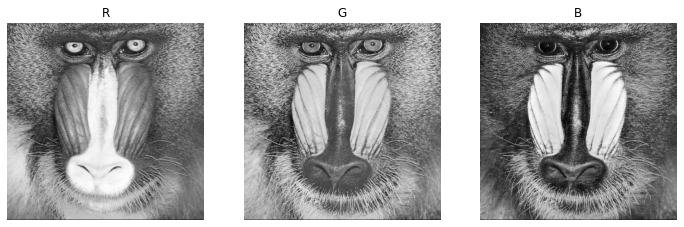

In [ ]:
plot_rgb(img_1)

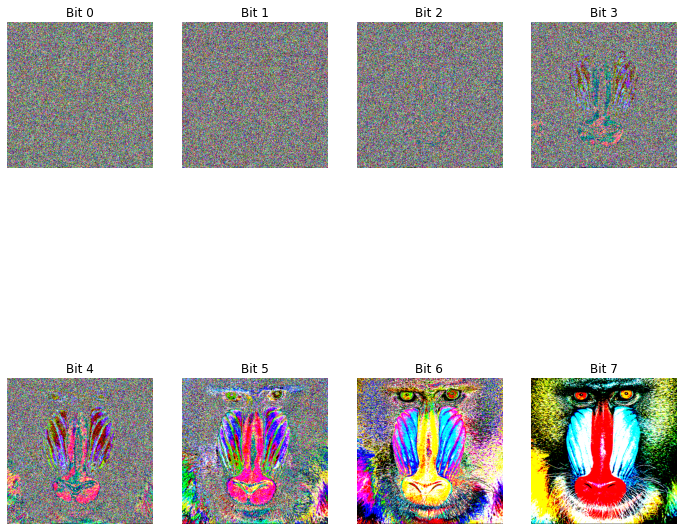

In [ ]:
plot_plan_of_bits(img_1)

#### Imagem com Texto 1

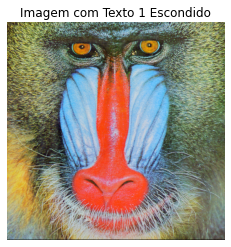

In [ ]:
img_1_encoded_1=encoder(img_1,text_1)

plt.imshow(img_1_encoded_1)
plt.title('Imagem com Texto 1 Escondido')
plt.axis('off') 

plt.imshow(img_1_encoded_1)
imageio.imwrite("/content/results/baboon_encoded_1.png", img_1_encoded_1)

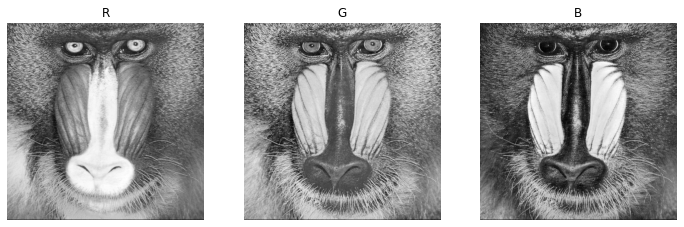

In [ ]:
plot_rgb(img_1_encoded_1)

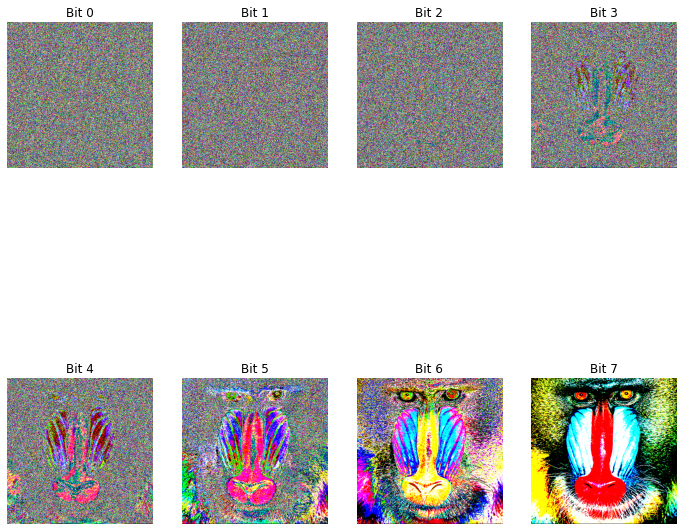

In [ ]:
plot_plan_of_bits(img_1_encoded_1)


In [ ]:
decoder(img_1_encoded_1)

'May the force be with you'

**Discussão** 
Como o texto é muito pequeno, visuamente não é possível visualizar qualquer alteração no plano de bits, na imagem encodada ou nos canais de cores.





#### Imagem com Texto 2

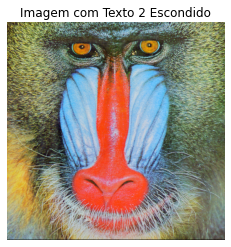

In [ ]:
img_1_encoded_2=encoder(img_1,text_2)

plt.imshow(img_1_encoded_2)
plt.title('Imagem com Texto 2 Escondido')
plt.axis('off') 

plt.imshow(img_1_encoded_2)
imageio.imwrite("/content/results/baboon_encoded_2.png", img_1_encoded_2)

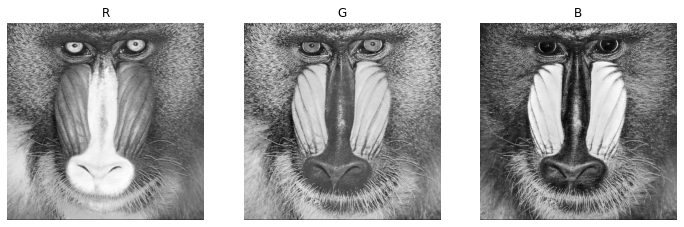

In [ ]:
plot_rgb(img_1_encoded_2)

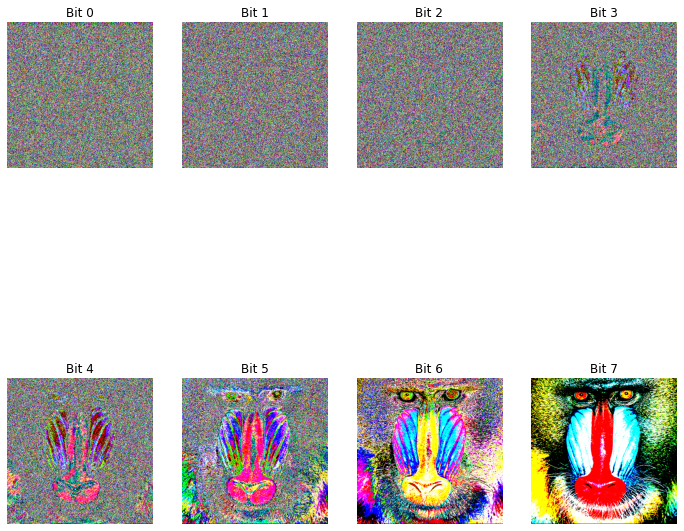

In [ ]:
plot_plan_of_bits(img_1_encoded_2)

In [ ]:
decoder(img_1_encoded_2)

"Have you got color in your cheeks' Do you ever get the feeling that you can't shift the tide That sticks around like something's in your teeth And some aces up your sleeve I had no idea that you're in deep I dreamt about you near me every night this week How many secrets can you keep' 'Cause there's this tune I found that makes me think of you somehow When I play it on repeat Until I fall asleep Spilling drinks on my settee  (Do I wanna know?) If this feeling flows both ways (Sad to see you go) Was sorta hoping that you'd stay (Baby we both know) That the nights were mainly made for saying things that you can't say tomorrow day  Crawlin' back to you.  Ever thought of calling when you've had a few? 'Cause I always do Maybe I'm too busy being yours to fall for somebody new Now I've thought it through  Crawling back to you  So have you got the guts? Been wondering if your heart's still open and if so I wanna know what time it shuts Simmer down and pucker up I'm sorry to interrupt it's ju

**Discussão** 
É possível observar uma pequena alteração no plano de bit 0 da imagem encodada, porém, na imagem encodada não é possível observar qualquer alteração e no canal de cores observou-se que em R as intensidades aparentam estar mais claras.

#### Imagem com Texto 3

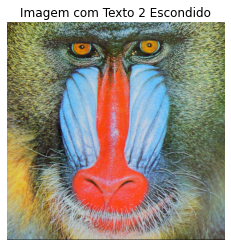

In [ ]:
img_1_encoded_3=encoder(img_1,text_3)

plt.imshow(img_1_encoded_3)
plt.title('Imagem com Texto 2 Escondido')
plt.axis('off') 

plt.imshow(img_1_encoded_3)
imageio.imwrite("/content/results/baboon_encoded_3.png", img_1_encoded_3)

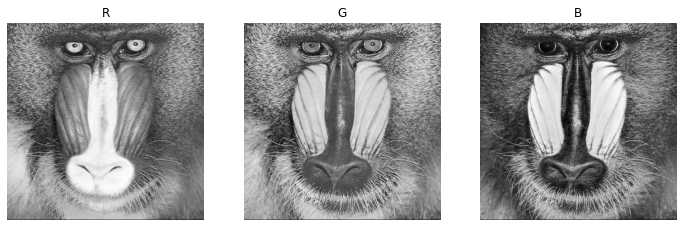

In [ ]:
plot_rgb(img_1_encoded_3)

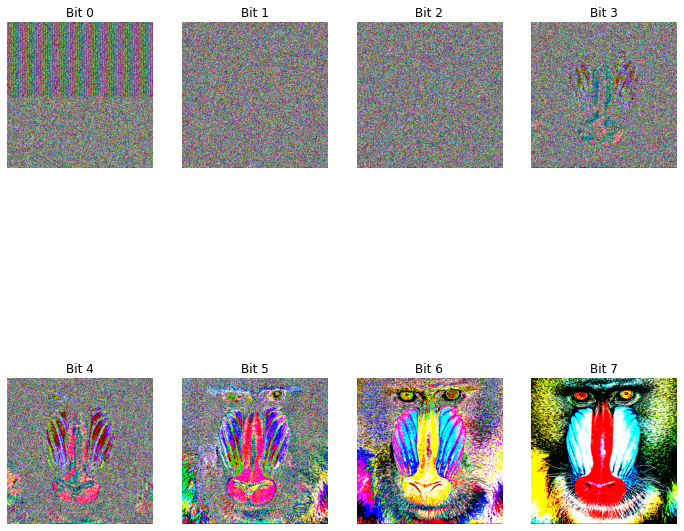

In [ ]:
plot_plan_of_bits(img_1_encoded_3)

In [ ]:
decoder(img_1_encoded_3)

'According to all known laws of aviation, there is no way a bee should be able to fly. Its wings are too small to get its fat little body off the ground. The bee, of course, flies anyway because bees don\'t care what humans think is impossible. Yellow, black. Yellow, black. Yellow, black. Yellow, black. Ooh, black and yellow! Let\'s shake it up a little. Barry! Breakfast is ready! Ooming! Hang on a second. Hello? - Barry? - Adam? - Oan you believe this is happening? - I can\'t. I\'ll pick you up. Looking sharp. Use the stairs. Your father paid good money for those. Sorry. I\'m excited. Here\'s the graduate. We\'re very proud of you, son. A perfect report card, all B\'s. Very proud. Ma! I got a thing going here. - You got lint on your fuzz. - Ow! That\'s me! - Wave to us! We\'ll be in row 118,000. - Bye! Barry, I told you, stop flying in the house! - Hey, Adam. - Hey, Barry. - Is that fuzz gel? - A little. Special day, graduation. Never thought I\'d make it. Three days grade school, thr

**Discussão** 
Como o texto é de um tamanho consideravel, é possível observar claramente a alteração no bit 0, porém ainda é imperceptível na imagem encodada. Nos canais de cores é possível observar que os detalhes estão com menos contrastes e as intensidades aparentam estar mais claras.

### Imagem 2

É uma imagem de tamanho (256,256,3) do quadro monalisa.

#### Imagem Original

In [ ]:
img_2.shape

(256, 256, 3)

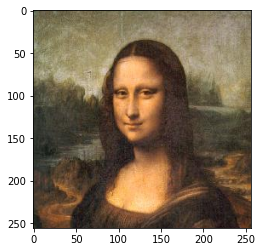

In [ ]:
plt.imshow(img_2)

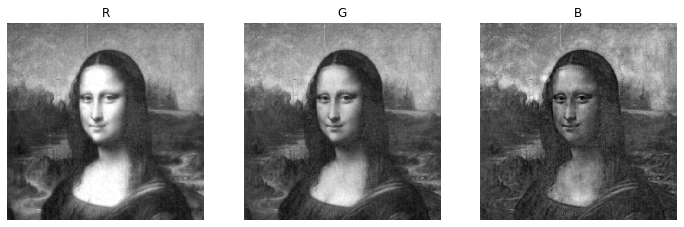

In [ ]:
plot_rgb(img_2)

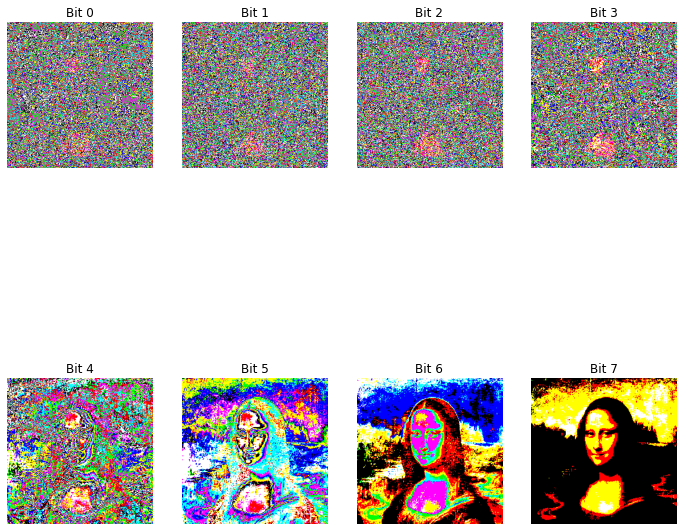

In [ ]:
plot_plan_of_bits(img_2)

#### Imagem com Texto 1

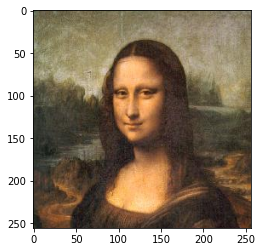

In [ ]:
img_2_encoded_1=encoder(img_2,text_1)
plt.imshow(img_2_encoded_1)
imageio.imwrite("/content/results/monalisa_encoded_1.png", img_2_encoded_1)

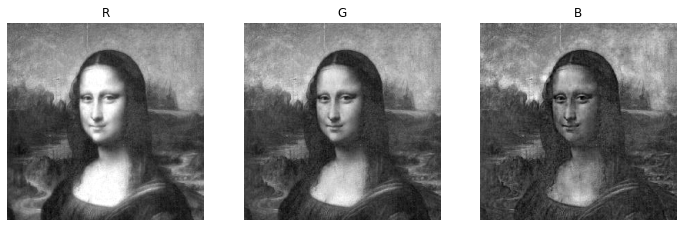

In [ ]:
plot_rgb(img_2_encoded_1)

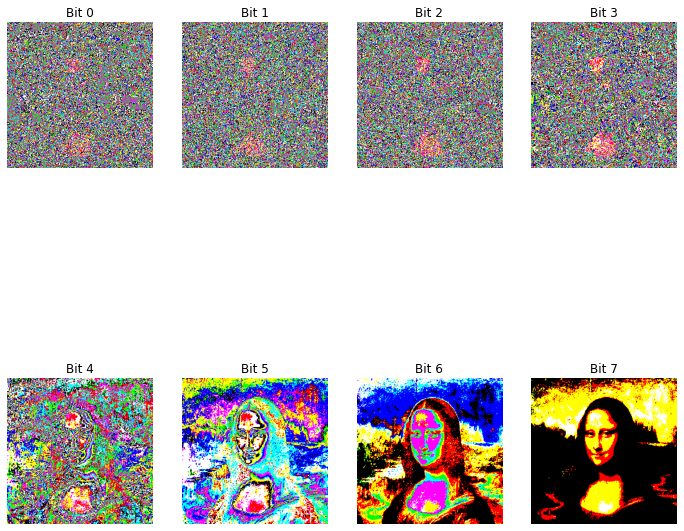

In [ ]:
plot_plan_of_bits(img_2_encoded_1)

In [ ]:
decoder(img_2_encoded_1)

'May the force be with you'

**Discussão** 
Como o texto é muito pequeno, visuamente não é possível visualizar qualquer alteração no plano de bits, na imagem encodada ou nos canais de cores.





#### Imagem com Texto 2

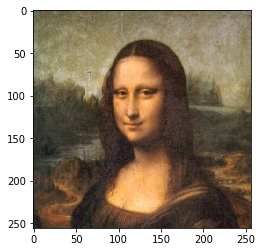

In [ ]:
img_2_encoded_2=encoder(img_2,text_2)
plt.imshow(img_2_encoded_2)
imageio.imwrite("/content/results/monalisa_encoded_2.png", img_2_encoded_2)

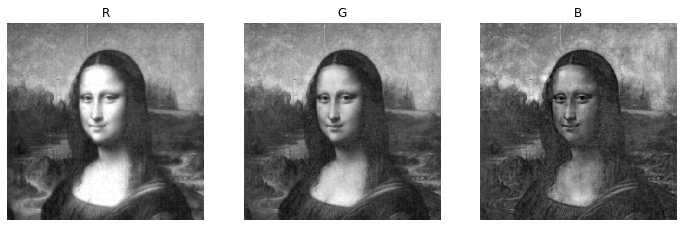

In [ ]:
plot_rgb(img_2_encoded_2)

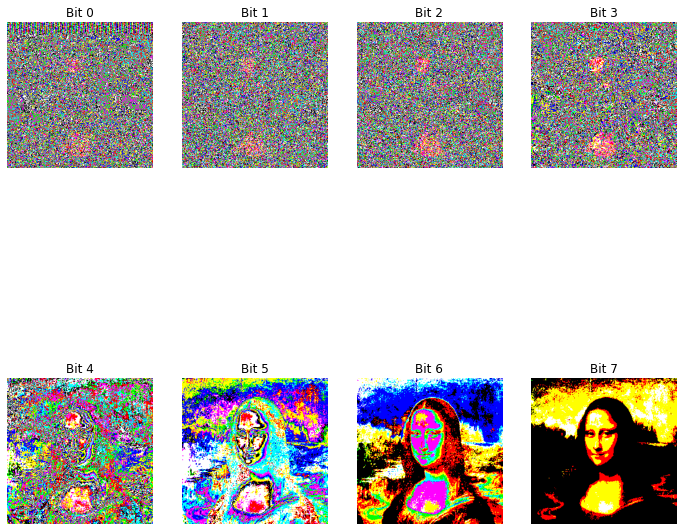

In [ ]:
plot_plan_of_bits(img_2_encoded_2)

In [ ]:
decoder(img_2_encoded_2)

"Have you got color in your cheeks' Do you ever get the feeling that you can't shift the tide That sticks around like something's in your teeth And some aces up your sleeve I had no idea that you're in deep I dreamt about you near me every night this week How many secrets can you keep' 'Cause there's this tune I found that makes me think of you somehow When I play it on repeat Until I fall asleep Spilling drinks on my settee  (Do I wanna know?) If this feeling flows both ways (Sad to see you go) Was sorta hoping that you'd stay (Baby we both know) That the nights were mainly made for saying things that you can't say tomorrow day  Crawlin' back to you.  Ever thought of calling when you've had a few? 'Cause I always do Maybe I'm too busy being yours to fall for somebody new Now I've thought it through  Crawling back to you  So have you got the guts? Been wondering if your heart's still open and if so I wanna know what time it shuts Simmer down and pucker up I'm sorry to interrupt it's ju

**Discussão** 
É possível observar uma alteração média no plano de bit 0 da imagem encodada, porém, na imagem encodada e no canais de cores não é possível observar qualquer alteração.

#### Imagem com Texto 3

In [ ]:
img_2_encoded_3=encoder(img_2,text_3)
#plt.imshow(img_2_encoded_3)
#imageio.imwrite("/content/results/monalisa_encoded_3.png", img_2_encoded_3)

ERROR: Need a bigger image.


In [ ]:
#plot_rgb(img_2_encoded_3)

In [ ]:
#plot_plan_of_bits(img_2_encoded_3)

In [ ]:
#decoder(img_2_encoded_3)

**Discussão** 
O texto é muito grande para a imagem 2, tem-se como sugestão para uma futura implementação utilizar os planos de bits 1 e/ou 2, que também são considerados menos significantes. 

### Imagem 3

É uma imagem de tamanho (512,512,3) de pimentões.

#### Imagem Original

In [ ]:
img_3.shape

(512, 512, 3)

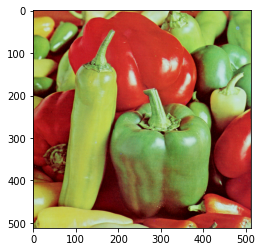

In [ ]:
plt.imshow(img_3)

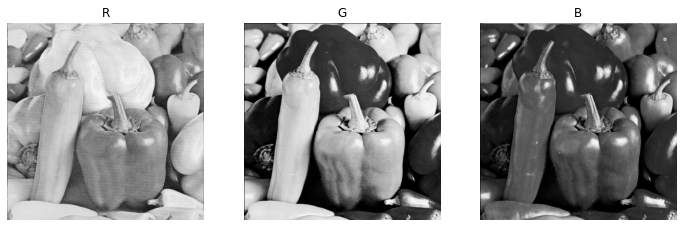

In [ ]:
plot_rgb(img_3)

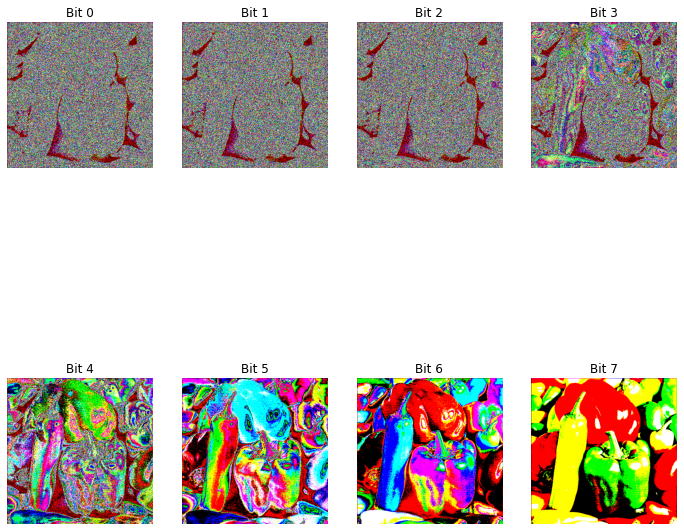

In [ ]:
plot_plan_of_bits(img_3)

#### Imagem com Texto 1

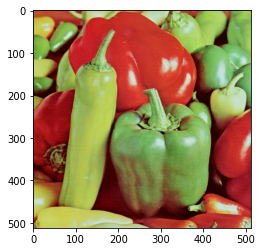

In [ ]:
img_3_encoded_1=encoder(img_3,text_1)
plt.imshow(img_3_encoded_1)
imageio.imwrite("/content/results/peppers_encoded_1.png", img_3_encoded_1)

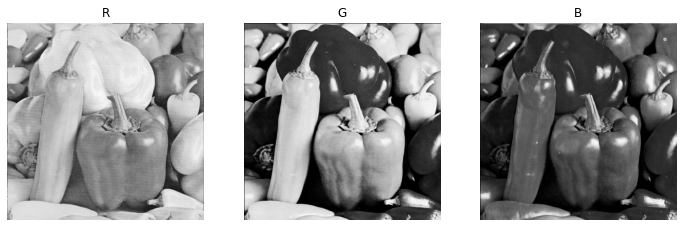

In [ ]:
plot_rgb(img_3_encoded_1)

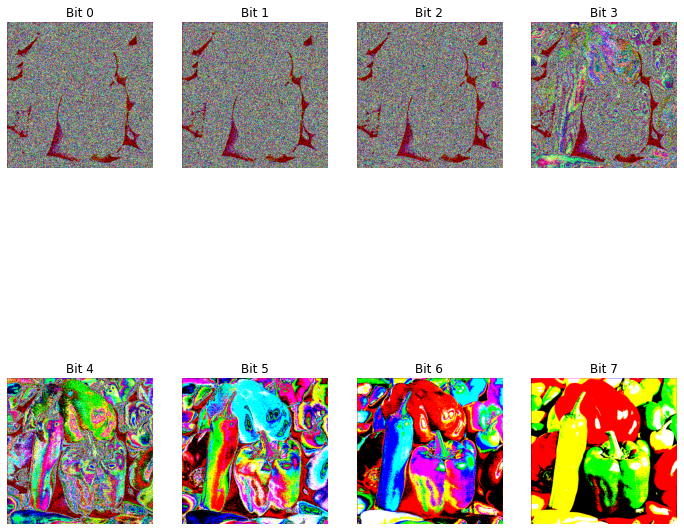

In [ ]:
plot_plan_of_bits(img_3_encoded_1)

In [ ]:
decoder(img_3_encoded_1)

'May the force be with you'

**Discussão** 
Como o texto é muito pequeno, é possivel ver uma pequena alteração no plano de bits 0 e não é possível visualizar qualquer alteração na imagem encodada ou nos canais de cores.





#### Imagem com Texto 2

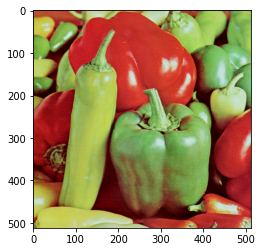

In [ ]:
img_3_encoded_2=encoder(img_3,text_2)
plt.imshow(img_3_encoded_2)
imageio.imwrite("/content/results/peppers_encoded_2.png", img_3_encoded_2)

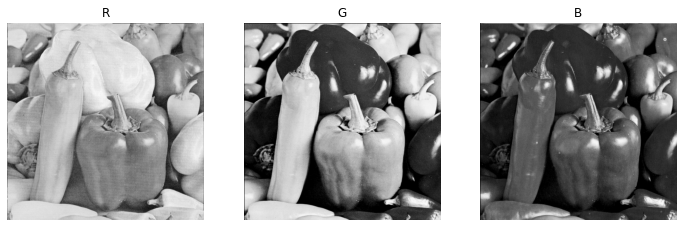

In [ ]:
plot_rgb(img_3_encoded_2)

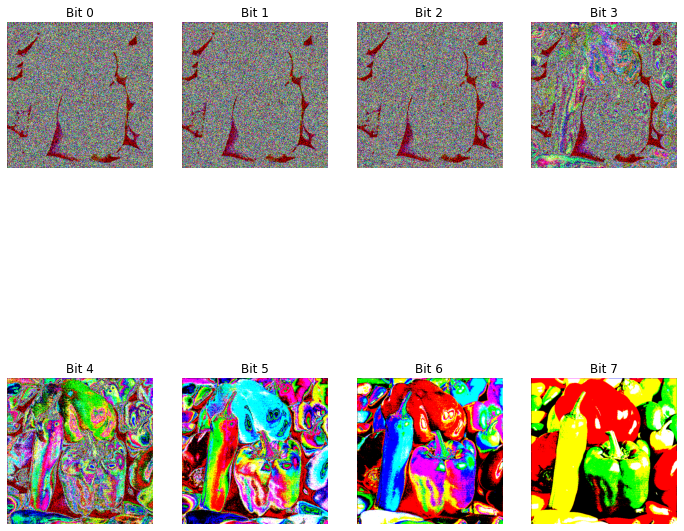

In [ ]:
plot_plan_of_bits(img_3_encoded_2)

In [ ]:
decoder(img_3_encoded_2)

"Have you got color in your cheeks' Do you ever get the feeling that you can't shift the tide That sticks around like something's in your teeth And some aces up your sleeve I had no idea that you're in deep I dreamt about you near me every night this week How many secrets can you keep' 'Cause there's this tune I found that makes me think of you somehow When I play it on repeat Until I fall asleep Spilling drinks on my settee  (Do I wanna know?) If this feeling flows both ways (Sad to see you go) Was sorta hoping that you'd stay (Baby we both know) That the nights were mainly made for saying things that you can't say tomorrow day  Crawlin' back to you.  Ever thought of calling when you've had a few? 'Cause I always do Maybe I'm too busy being yours to fall for somebody new Now I've thought it through  Crawling back to you  So have you got the guts? Been wondering if your heart's still open and if so I wanna know what time it shuts Simmer down and pucker up I'm sorry to interrupt it's ju

**Discussão** 
É possível observar uma pequena alteração no plano de bit 0 da imagem encodada, porém, na imagem encodada e nos canais de cores não é possível observar qualquer alteração.

#### Imagem com Texto 3

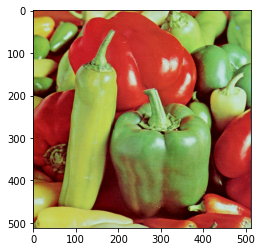

In [ ]:
img_3_encoded_3=encoder(img_3,text_3)
plt.imshow(img_3_encoded_3)
imageio.imwrite("/content/results/peppers_encoded_3.png", img_3_encoded_3)

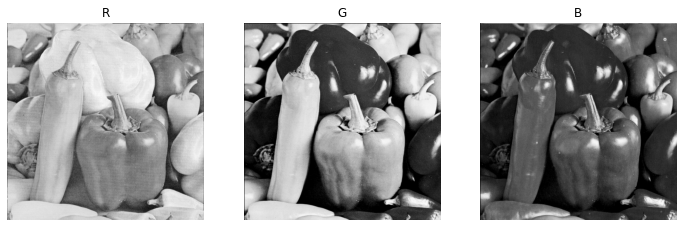

In [ ]:
plot_rgb(img_3_encoded_3)

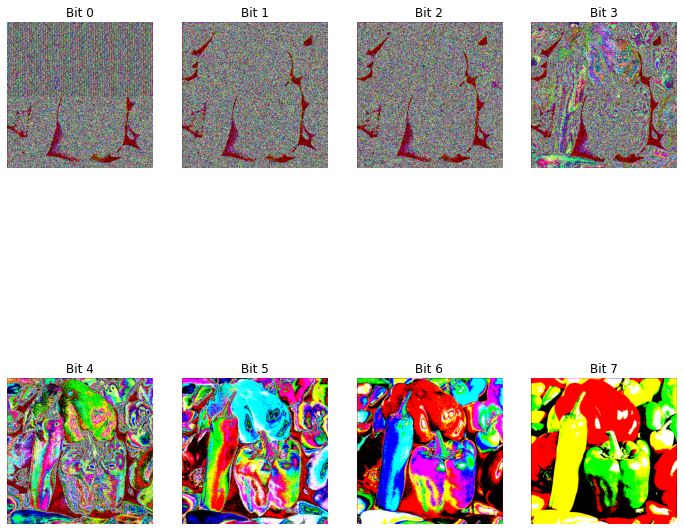

In [ ]:
plot_plan_of_bits(img_3_encoded_3)

In [ ]:
decoder(img_3_encoded_3)

'According to all known laws of aviation, there is no way a bee should be able to fly. Its wings are too small to get its fat little body off the ground. The bee, of course, flies anyway because bees don\'t care what humans think is impossible. Yellow, black. Yellow, black. Yellow, black. Yellow, black. Ooh, black and yellow! Let\'s shake it up a little. Barry! Breakfast is ready! Ooming! Hang on a second. Hello? - Barry? - Adam? - Oan you believe this is happening? - I can\'t. I\'ll pick you up. Looking sharp. Use the stairs. Your father paid good money for those. Sorry. I\'m excited. Here\'s the graduate. We\'re very proud of you, son. A perfect report card, all B\'s. Very proud. Ma! I got a thing going here. - You got lint on your fuzz. - Ow! That\'s me! - Wave to us! We\'ll be in row 118,000. - Bye! Barry, I told you, stop flying in the house! - Hey, Adam. - Hey, Barry. - Is that fuzz gel? - A little. Special day, graduation. Never thought I\'d make it. Three days grade school, thr

**Discussão** 
É possível observar uma clara alteração no plano de bit 0 da imagem encodada, e uma perda de detalhes na imagem encodada devido a alteração. No canal de cores, observou-se que em R as intensidades aparentam estar mais claras e com menos detalhes também.

### Imagem 4

É uma imagem de tamanho (768,1024,3) de um relógio com um livro e simbolos de fundo.

#### Imagem Original

In [ ]:
img_4.shape

(768, 1024, 3)

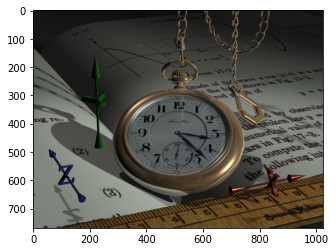

In [ ]:
plt.imshow(img_4)

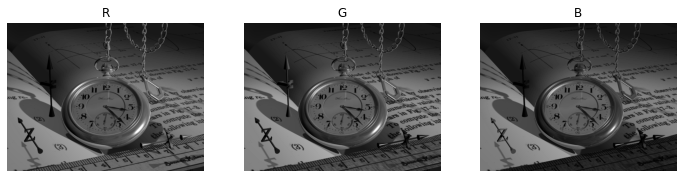

In [ ]:
plot_rgb(img_4)

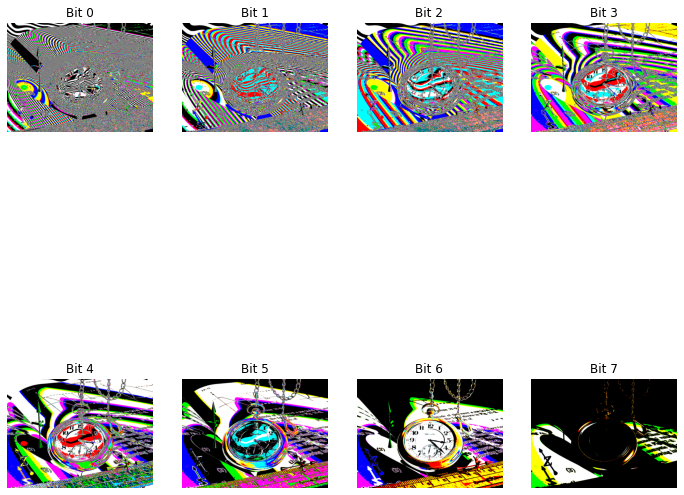

In [ ]:
plot_plan_of_bits(img_4)

#### Imagem com Texto 1

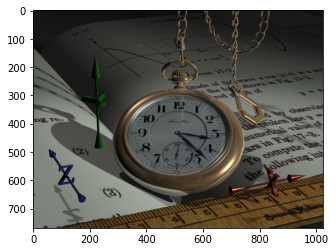

In [ ]:
img_4_encoded_1=encoder(img_4,text_1)
plt.imshow(img_4_encoded_1)
imageio.imwrite("/content/results/watch_encoded_1.png", img_4_encoded_1)

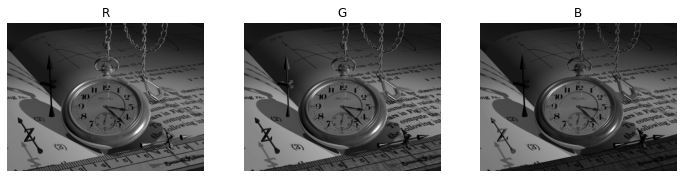

In [ ]:
plot_rgb(img_4_encoded_1)

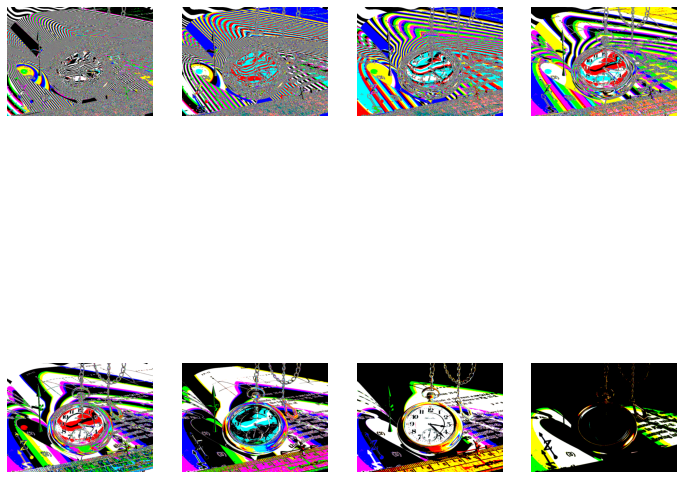

In [ ]:
plot_plan_of_bits(img_4_encoded_1)

In [ ]:
decoder(img_4_encoded_1)

'May the force be with you'

**Discussão** 
Como o texto é muito pequeno, visuamente não é possível visualizar qualquer alteração no plano de bits, na imagem encodada ou nos canais de cores.





#### Imagem com Texto 2


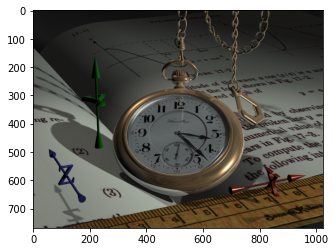

In [ ]:
img_4_encoded_2=encoder(img_4,text_2)
plt.imshow(img_4_encoded_2)
imageio.imwrite("/content/results/watch_encoded_2.png", img_4_encoded_2)

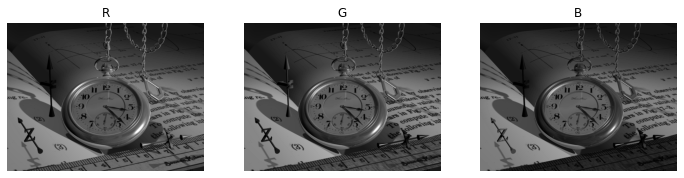

In [ ]:
plot_rgb(img_4_encoded_2)

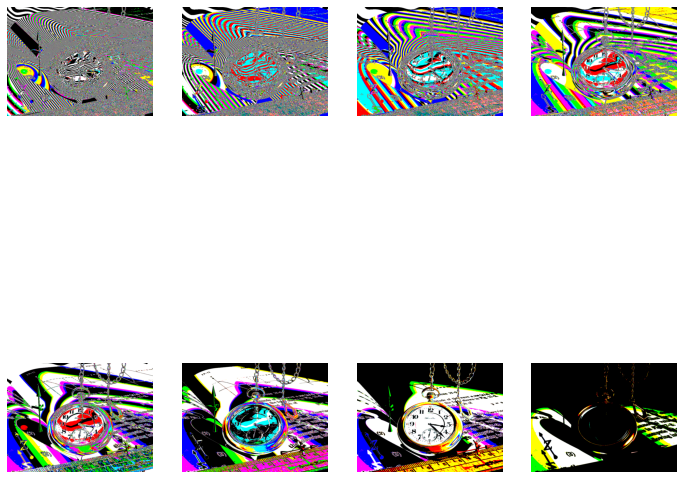

In [ ]:
plot_plan_of_bits(img_4_encoded_2)

In [ ]:
decoder(img_4_encoded_2)

"Have you got color in your cheeks' Do you ever get the feeling that you can't shift the tide That sticks around like something's in your teeth And some aces up your sleeve I had no idea that you're in deep I dreamt about you near me every night this week How many secrets can you keep' 'Cause there's this tune I found that makes me think of you somehow When I play it on repeat Until I fall asleep Spilling drinks on my settee  (Do I wanna know?) If this feeling flows both ways (Sad to see you go) Was sorta hoping that you'd stay (Baby we both know) That the nights were mainly made for saying things that you can't say tomorrow day  Crawlin' back to you.  Ever thought of calling when you've had a few? 'Cause I always do Maybe I'm too busy being yours to fall for somebody new Now I've thought it through  Crawling back to you  So have you got the guts? Been wondering if your heart's still open and if so I wanna know what time it shuts Simmer down and pucker up I'm sorry to interrupt it's ju

**Discussão** 
Como o texto é muito pequeno comparado a imagem original, visuamente não é possível visualizar qualquer alteração no plano de bits, na imagem encodada ou nos canais de cores.





#### Imagem com Texto 3

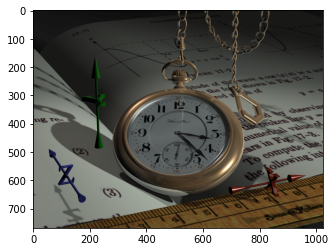

In [ ]:
img_4_encoded_3=encoder(img_4,text_3)
plt.imshow(img_4_encoded_3)
imageio.imwrite("/content/results/watch_encoded_3.png", img_4_encoded_3)

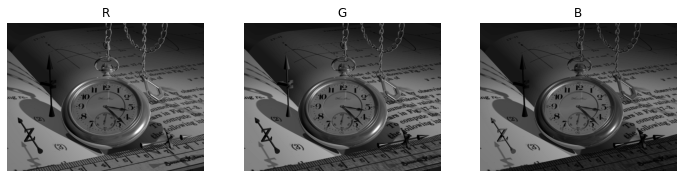

In [ ]:
plot_rgb(img_4_encoded_3)

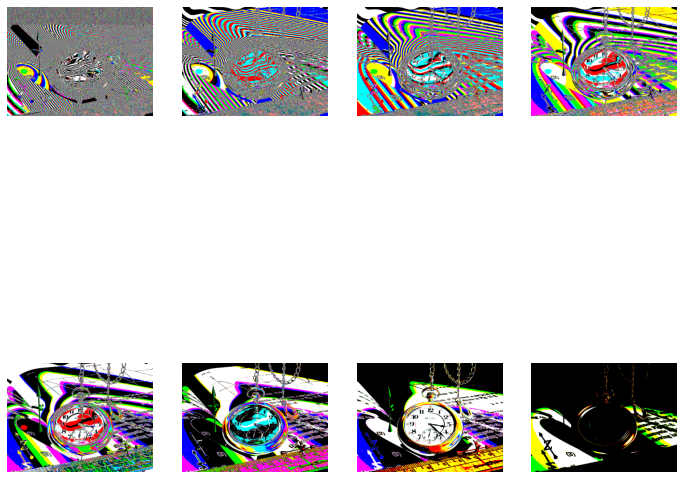

In [ ]:
plot_plan_of_bits(img_4_encoded_3)

In [ ]:
decoder(img_4_encoded_3)

'According to all known laws of aviation, there is no way a bee should be able to fly. Its wings are too small to get its fat little body off the ground. The bee, of course, flies anyway because bees don\'t care what humans think is impossible. Yellow, black. Yellow, black. Yellow, black. Yellow, black. Ooh, black and yellow! Let\'s shake it up a little. Barry! Breakfast is ready! Ooming! Hang on a second. Hello? - Barry? - Adam? - Oan you believe this is happening? - I can\'t. I\'ll pick you up. Looking sharp. Use the stairs. Your father paid good money for those. Sorry. I\'m excited. Here\'s the graduate. We\'re very proud of you, son. A perfect report card, all B\'s. Very proud. Ma! I got a thing going here. - You got lint on your fuzz. - Ow! That\'s me! - Wave to us! We\'ll be in row 118,000. - Bye! Barry, I told you, stop flying in the house! - Hey, Adam. - Hey, Barry. - Is that fuzz gel? - A little. Special day, graduation. Never thought I\'d make it. Three days grade school, thr

**Discussão** 
Como o texto é de um tamanho consideravel, é possível observar claramente a alteração no bit 0, porém ainda é imperceptível na imagem encodada. Nos canais de cores é possível observar que os detalhes estão com menos contrastes.

## Conclusão

Conclui-se que o modelo desenvolvido de esteganografia cumpre os objetivos de esconder um texto em uma imagem de forma imperceptível ao olho humano.

## Teste com outras imagems:

Para testar com outras imagens, salve-as na pasta do notebook e inicie os códigos das células a seguir. É necessario que as imagens sejam do tipo png.

#### Inputs

In [ ]:
filename = input('Nome da imagem com a extensão:')
img = imageio.imread(filename)
plt.imshow(img)

In [ ]:
text = input("Entre com o texto: ")
if not text.isascii():
  raise "Non ascii text are currently not supported."

#### Imagem Original

In [ ]:
plot_rgb(img)

In [ ]:
plot_plan_of_bits(img)

#Imagem com Texto

In [ ]:
img_encoded = encoder(img,text)
imageio.imwrite("/content/results/img_encoded.png",img_encoded )
plt.imshow(img_encoded)

In [ ]:
plot_rgb(img_encoded)

In [ ]:
plot_plan_of_bits(img_encoded)

In [ ]:
texto_recuperado = decoder(img_encoded)
texto_recuperado